In [1]:
!pip install ipywidgets
import widgets

ModuleNotFoundError: No module named 'widgets'

In [2]:
import json 
import numpy as np
import pandas as pd

In [3]:
import io
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
from pandas.plotting import scatter_matrix

In [4]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import Birch

In [5]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Pre-Proccessing Steps

In [6]:
#Import CSV
import pandas as pd
df_raw = pd.read_csv('Cluster_5_6.csv')

In [7]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98965 entries, 0 to 98964
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   X                  98965 non-null  float64
 1   Y                  98965 non-null  int64  
 2   OSM_ID             98965 non-null  int64  
 3   AGE                98965 non-null  int64  
 4   HEIGHT             98965 non-null  float64
 5   AREA               98965 non-null  float64
 6   VOLUME             98965 non-null  float64
 7   MBR_LENGTH         98965 non-null  float64
 8   MBR_WIDTH          98965 non-null  float64
 9   MBR_L/W            98965 non-null  float64
 10  PERIMETER          98965 non-null  float64
 11  WALL_AREA          98965 non-null  float64
 12  VERTEX_COUNT(S)    98965 non-null  int64  
 13  VERTEX_COMPLEXITY  98965 non-null  float64
 14  ERI                98965 non-null  float64
 15  CONVEX             98965 non-null  float64
 16  RI                 989

In [8]:
# checking columns for missing values
df_raw.isna().sum()

X                    0
Y                    0
OSM_ID               0
AGE                  0
HEIGHT               0
AREA                 0
VOLUME               0
MBR_LENGTH           0
MBR_WIDTH            0
MBR_L/W              0
PERIMETER            0
WALL_AREA            0
VERTEX_COUNT(S)      0
VERTEX_COMPLEXITY    0
ERI                  0
CONVEX               0
RI                   0
DENSITY              0
NO_POLYLINES         0
BBOX(A)/AREA         0
PER/AREA             0
AREA-VOIDAREA        0
Cluster              0
dtype: int64

In [9]:
# Select subset of columns aka variables
Columns_of_interest = ["X" ,
                      "Y",
                      "OSM_ID",
                      "AGE",
                      "HEIGHT",
                      "AREA",
                      "VOLUME",
                      "MBR_LENGTH",
                      "MBR_WIDTH",
                      "MBR_L/W",
                      "PERIMETER",
                      "WALL_AREA",
                       "VERTEX_COUNT(S)",
                       "VERTEX_COMPLEXITY",
                       "ERI",
                       "CONVEX",
                       "RI",
                       "DENSITY",
                       "NO_POLYLINES",
                       "BBOX(A)/AREA",
                       "PER/AREA",
                       "AREA-VOIDAREA",
                       "Cluster",
                      ]
# create new dataframe 
df = df_raw[Columns_of_interest]

In [10]:
# Finding correlation (uncover correlated variables)
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\james\AppData\Local\Temp\ipykernel_33272\2887697062.py:3: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,X,Y,OSM_ID,AGE,HEIGHT,AREA,VOLUME,MBR_LENGTH,MBR_WIDTH,MBR_L/W,PERIMETER,WALL_AREA,VERTEX_COUNT(S),VERTEX_COMPLEXITY,ERI,CONVEX,RI,DENSITY,NO_POLYLINES,BBOX(A)/AREA,PER/AREA,AREA-VOIDAREA,Cluster
X,1.00,-0.25,0.07,-0.01,-0.08,0.03,0.00,0.03,0.02,0.03,0.03,-0.02,0.03,0.01,0.04,0.03,-0.01,-0.01,-0.01,-0.04,0.02,0.03,0.00
Y,-0.25,1.00,-0.03,-0.10,0.01,-0.04,-0.02,-0.07,-0.03,-0.06,-0.06,-0.02,-0.06,-0.02,-0.04,-0.04,0.01,0.00,0.01,0.04,0.08,-0.04,-0.01
OSM_ID,0.07,-0.03,1.00,0.07,-0.03,-0.02,-0.03,-0.02,-0.02,0.00,-0.02,-0.03,-0.04,-0.00,-0.05,-0.00,0.02,-0.23,-0.27,0.01,0.02,-0.02,0.01
AGE,-0.01,-0.10,0.07,1.00,-0.23,-0.00,-0.03,-0.11,0.05,-0.24,-0.06,-0.13,-0.01,-0.10,-0.08,-0.06,0.00,-0.01,-0.03,0.09,-0.06,-0.00,-0.01
HEIGHT,-0.08,0.01,-0.03,-0.23,1.00,0.31,0.49,0.35,0.30,0.11,0.35,0.72,0.15,0.17,0.02,0.01,-0.06,-0.01,0.01,-0.04,-0.45,0.31,0.29
AREA,0.03,-0.04,-0.02,-0.00,0.31,1.00,0.92,0.86,0.84,0.05,0.94,0.82,0.52,0.24,0.36,0.31,-0.32,0.08,0.10,-0.27,-0.69,1.00,0.20
VOLUME,0.00,-0.02,-0.03,-0.03,0.49,0.92,1.00,0.79,0.76,0.06,0.85,0.92,0.44,0.22,0.29,0.25,-0.26,0.06,0.08,-0.21,-0.63,0.92,0.36
MBR_LENGTH,0.03,-0.07,-0.02,-0.11,0.35,0.86,0.79,1.00,0.61,0.46,0.94,0.81,0.52,0.31,0.46,0.43,-0.28,0.08,0.10,-0.39,-0.59,0.86,0.18
MBR_WIDTH,0.02,-0.03,-0.02,0.05,0.30,0.84,0.76,0.61,1.00,-0.33,0.82,0.71,0.57,0.31,0.44,0.42,-0.54,0.06,0.08,-0.40,-0.80,0.84,0.16
MBR_L/W,0.03,-0.06,0.00,-0.24,0.11,0.05,0.06,0.46,-0.33,1.00,0.20,0.18,-0.01,0.06,0.11,0.09,0.26,0.05,0.06,-0.07,0.20,0.05,0.03


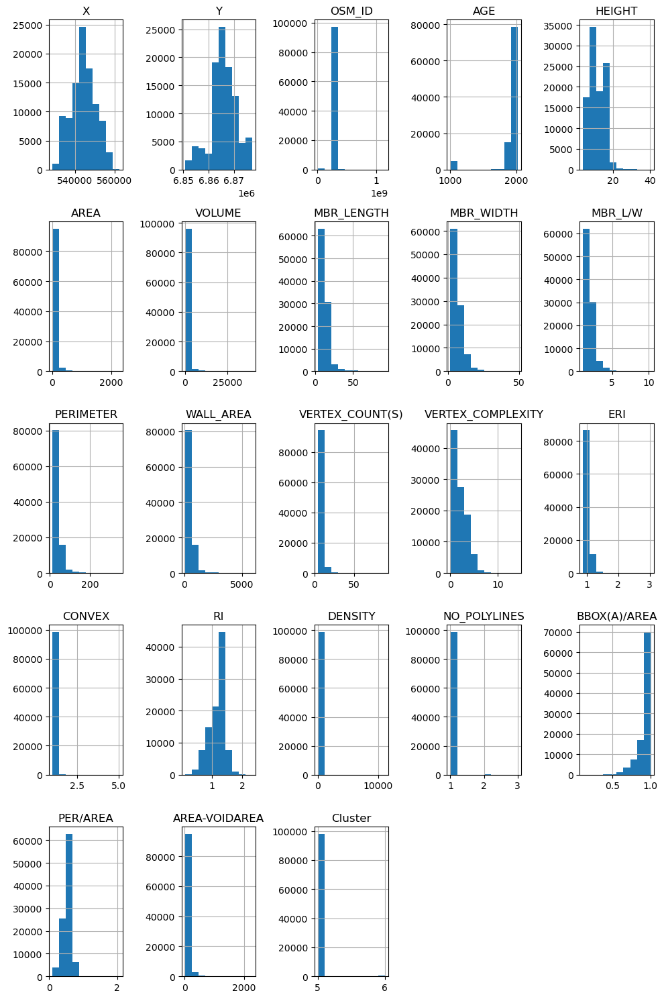

In [11]:
# Data distribution (histograms) for each variable
ax = df.hist(figsize=(10,15))
plt.tight_layout()
plt.show()

In [12]:
# Extract coords from data
df_coords = df[['X', 'Y']]

# df_data   = df[['ForestPark', 'UrbanParks', 'HN_noise_40', 'RailwaySystem', 'PortSystem']]
df_data   = df.drop(["X" , "Y", "OSM_ID", "Cluster", "VOLUME", "MBR_L/W", "AGE", "WALL_AREA", "BBOX(A)/AREA", "PER/AREA"], axis=1)

# Scale data
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(
    scaler.fit_transform(df_data),
    columns=df_data.columns)

In [13]:
def map_clustering_results(coords, model):
    labels = model.labels_
    for label in np.unique(labels):
        x = coords['X'].to_numpy()[labels == label]
        y = coords['Y'].to_numpy()[labels == label]
        plt.scatter(x, y, label=model.labels_)

In [14]:
print(scaled_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98965 entries, 0 to 98964
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   HEIGHT             98965 non-null  float64
 1   AREA               98965 non-null  float64
 2   MBR_LENGTH         98965 non-null  float64
 3   MBR_WIDTH          98965 non-null  float64
 4   PERIMETER          98965 non-null  float64
 5   VERTEX_COUNT(S)    98965 non-null  float64
 6   VERTEX_COMPLEXITY  98965 non-null  float64
 7   ERI                98965 non-null  float64
 8   CONVEX             98965 non-null  float64
 9   RI                 98965 non-null  float64
 10  DENSITY            98965 non-null  float64
 11  NO_POLYLINES       98965 non-null  float64
 12  AREA-VOIDAREA      98965 non-null  float64
dtypes: float64(13)
memory usage: 9.8 MB
None


# BIRCH CLUSTERING

In [16]:
#Birch is computed as a method of Data reduction, NOT as a final clustering method

In [17]:
# Perform Birch clustering
brc_model_details = Birch(branching_factor=2, n_clusters=None, threshold=0.05, compute_labels=True)
brc_model_details.fit(scaled_df)

Birch(branching_factor=2, n_clusters=None, threshold=0.05)

In [18]:
# Add the Birch clustering labels to the DataFrame
df['Birch Cluster Details'] = brc_model_details.labels_

# DIANA CLUSTERING 

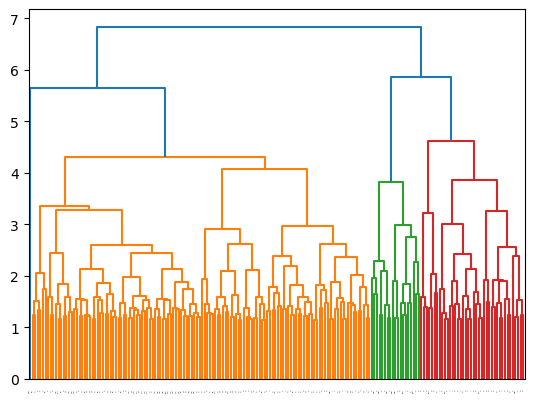

<Figure size 1500x1000 with 0 Axes>

In [19]:
# Compute linkage matrix for hierarchical clustering
dist_mat = linkage(brc_model_details.subcluster_centers_, method='complete', metric='cityblock')

# Generate dendrogram
dendrogram(dist_mat, truncate_mode='lastp', p=190, leaf_rotation=90., leaf_font_size=1., show_contracted=True)

# Plot the dendrogram
plt.figure(figsize=(15, 10))  # Adjust the figure size as per your preference
plt.show()

In [20]:
# Perform DIANA clustering using the specified threshold
diana_model_details = fcluster(dist_mat, t=2.5, criterion='distance')

In [21]:
# Create a mapping between Birch subcluster labels and DIANA cluster labels
mapping = {}
for i, birch_label in enumerate(np.unique(df['Birch Cluster Details'])):
    mapping[birch_label] = diana_model_details[i % len(diana_model_details)]

In [22]:
# Add the DIANA clustering labels to the Birch subcluster labels
df['DIANA Cluster Details'] = df['Birch Cluster Details'].map(mapping)

In [23]:
print(df)

              X        Y      OSM_ID   AGE    HEIGHT       AREA        VOLUME  \
0      543419.6  6865734    57858477  1883   3.71632   24.48315     90.987220   
1      546673.4  6865699   268998926  1922  13.42790   78.55155   1054.782358   
2      541880.1  6863804   277154174  1928  10.06230  194.12325   1953.326378   
3      534512.7  6869668   274436857  2006   9.05961   49.52115    448.642306   
4      534516.2  6869695   274436881  2006   9.08412   49.60280    450.597788   
...         ...      ...         ...   ...       ...        ...           ...   
98960  539426.5  6864817  1148323938  2010  21.40250  561.39740  12015.307850   
98961  539425.3  6864896  1148323940  2010  21.41250  565.26760  12103.792490   
98962  539451.3  6864975  1148325665  2009  21.48500  563.27785  12102.024610   
98963  539371.8  6864973  1148325666  2009  21.49140  561.30960  12063.329140   
98964  544467.4  6867650  1153501055  1005  14.05420   77.20880   1085.107917   

       MBR_LENGTH  MBR_WIDT

In [24]:
#check that you have the correct amount of clusters added back to your df
min_cluster = df['DIANA Cluster Details'].min()
max_cluster = df['DIANA Cluster Details'].max()

print("Birch Cluster Details range:", min_cluster, "-", max_cluster)

Birch Cluster Details range: 1 - 22


In [25]:
# Count the number of buildings in each cluster assignment
cluster_counts = df['DIANA Cluster Details'].value_counts()

In [26]:
print(cluster_counts)

2     50752
4     36028
6      8356
3      1255
8       865
14      385
10      313
1       265
7       212
5       113
21       98
19       93
9        74
17       47
22       26
12       22
18       16
20       14
15       12
16        7
11        7
13        5
Name: DIANA Cluster Details, dtype: int64


In [27]:
#Export CSV with Cluster Values
#df.to_csv('DIANA_Details_5_6_t2.5.csv', index=False)

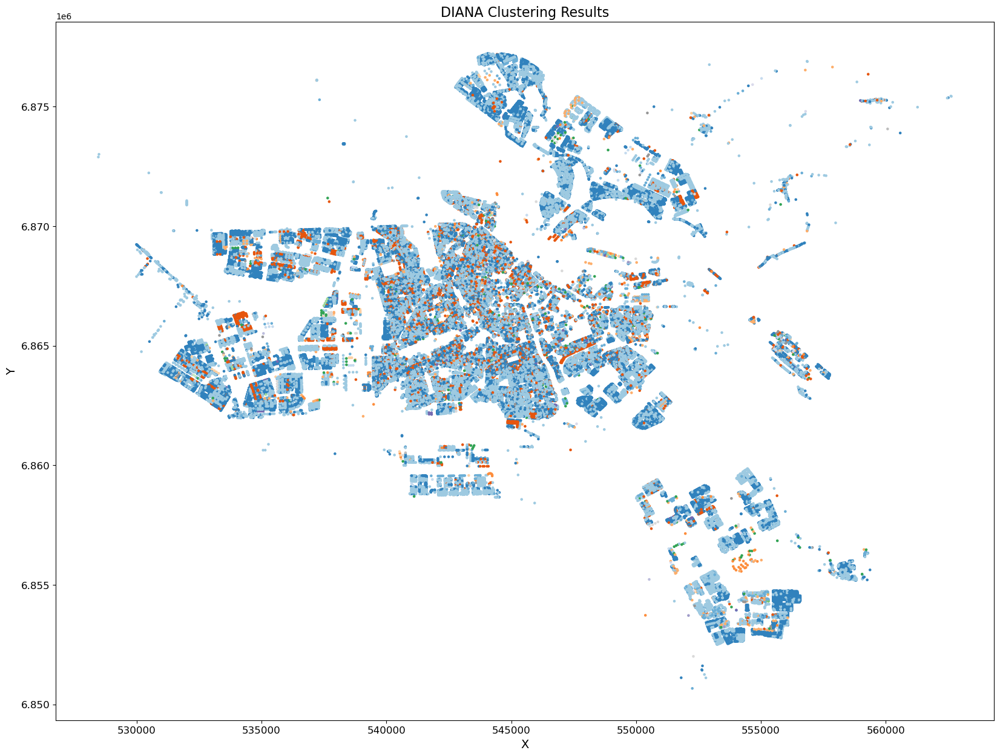

In [28]:
# Extract X and Y coordinates
x = df['X']
y = df['Y']

# Extract cluster labels
labels = df['DIANA Cluster Details']

# Create scatter plot with different colors for each cluster
plt.figure(figsize=(20,15)) # set figure size
plt.scatter(x, y, c=labels, cmap='tab20c', s=5) # set marker size

# Add axis labels and title
plt.xlabel('X', fontsize=14)
plt.ylabel('Y', fontsize=14)
plt.title('DIANA Clustering Results', fontsize=16)

# Set axis tick labels font size
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.show()

# Cluster Evaluation

C:\Users\james\AppData\Local\Programs\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning:

The palette list has more values (67) than needed (22), which may not be intended.

C:\Users\james\AppData\Local\Programs\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning:

The palette list has more values (67) than needed (22), which may not be intended.

C:\Users\james\AppData\Local\Programs\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning:

The palette list has more values (67) than needed (22), which may not be intended.

C:\Users\james\AppData\Local\Programs\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning:

The palette list has more values (67) than needed (22), which may not be intended.

C:\Users\james\AppData\Local\Programs\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\seaborn\axisgrid.py

<Figure size 1500x1500 with 0 Axes>

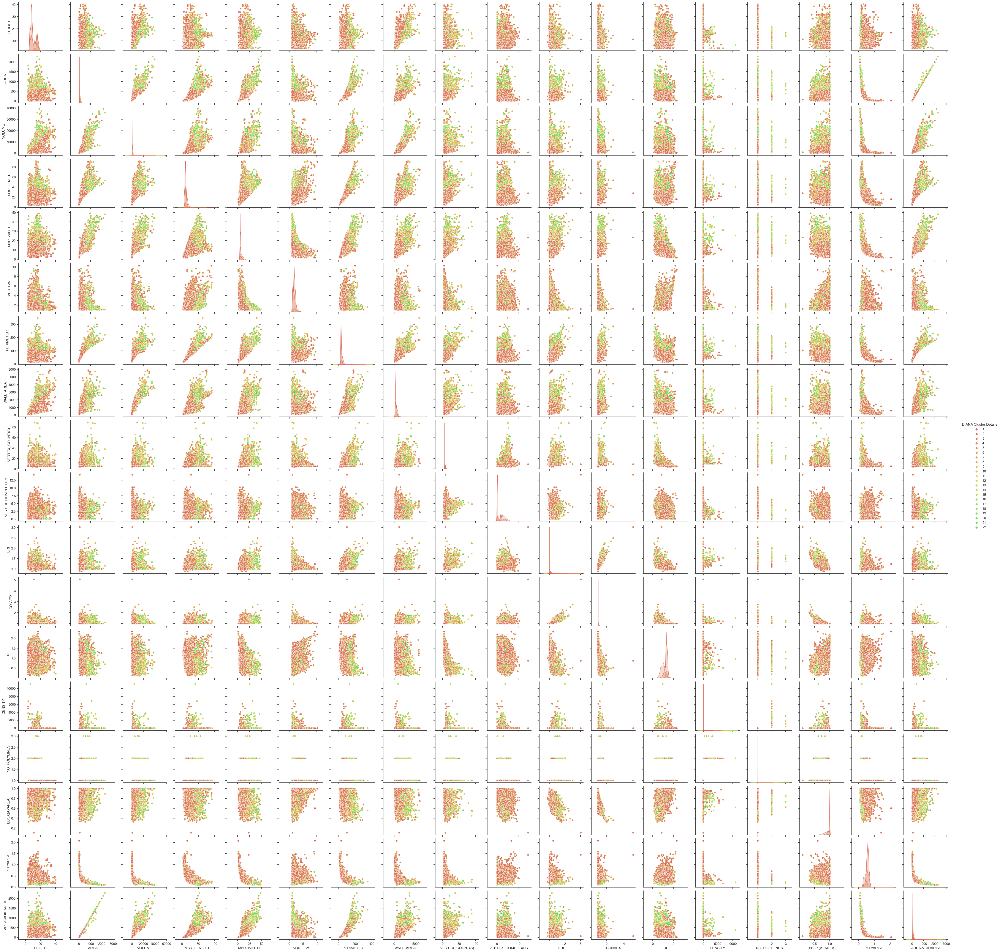

In [29]:
import seaborn as sns

# Select the relevant columns for pairwise plotting
columns_of_interest = ['DIANA Cluster Details',  'HEIGHT', 'AREA', 'VOLUME', 'MBR_LENGTH', 'MBR_WIDTH', 'MBR_L/W', 'PERIMETER', 'WALL_AREA', 'VERTEX_COUNT(S)', 'VERTEX_COMPLEXITY', 'ERI', 'CONVEX', 'RI', 'DENSITY', 'NO_POLYLINES', 'BBOX(A)/AREA', 'PER/AREA', 'AREA-VOIDAREA']

# Subset the DataFrame with the selected columns
subset_df = df[columns_of_interest]

# Drop rows with missing values (NaN)
subset_df = subset_df.dropna()

# Set the size of the figure
plt.figure(figsize=(15, 15))  # Adjust the figure size as per your preference

# Set the style of the plot
sns.set(style="ticks")

# Set the palette for the clusters
palette = sns.color_palette("hls", 67)  # Replace number with the actual number of clusters

# Create a pairplot with cluster colors
sns.pairplot(subset_df, hue='DIANA Cluster Details', palette=palette)

# Show the plot
plt.show()